<a href="https://colab.research.google.com/github/asummerz/AI/blob/main/240202_EST_Gemini_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gemini API: Quickstart with Python

이 노트북은 https://ai.google.dev/docs 의 문서들을 교육목적으로 추출/번역한 것입니다. 더욱 자세한 내용은 원문을 참조하세요.

In [1]:
!pip install -q -U google-generativeai

In [2]:
import google.generativeai as genai

# 노트북에 보기 좋게 출력하기 위한 Utillity
from IPython.display import display
from IPython.display import Markdown

import textwrap
def to_markdown(text):
  text = text.replace('•', '  *')
  return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))

In [3]:
# API key를 안전하게 보관하기 위한 패키지
from google.colab import userdata

### Setup your API key

Google AI Studio에서 API key를 발급 받았는지 확인하세요.

<a class="button button-primary" href="https://makersuite.google.com/app/apikey" target="_blank" rel="noopener noreferrer">Get an API key</a>

- 왼쪽 메뉴에 열쇠🔑 아이콘을 클릭하고 `+ 새 보안 비밀 추가`를 클릭하세요.
- `GOOGLE_API_KEY`라는 이름으로 발급받은 API key를 저장하세요.
- `노트북 액세스`를 활성화 해 주세요.

In [4]:
GOOGLE_API_KEY=userdata.get('GOOGLE_API_KEY')

genai.configure(api_key=GOOGLE_API_KEY)

In [5]:
for m in genai.list_models():
  print(m.name)

models/chat-bison-001
models/text-bison-001
models/embedding-gecko-001
models/gemini-pro
models/gemini-pro-vision
models/embedding-001
models/aqa


### old ver. models
models/chat-bison-001
models/text-bison-001
models/embedding-gecko-001

## Generate text from text inputs

In [6]:
model = genai.GenerativeModel('gemini-pro')

In [7]:
cfg = genai.GenerationConfig(
    candidate_count = 1,
    stop_sequences = None,
    max_output_tokens = None,   # default 2048
    temperature = 0.01,
    top_k = 32,
    top_p = 0.8
)

In [8]:
%%time
response = model.generate_content("동해물과 ", generation_config=cfg)
to_markdown(response.text)    # markdown문으로 출력

CPU times: user 54.2 ms, sys: 8.51 ms, total: 62.7 ms
Wall time: 3.3 s


> 백두산이 마르고 닳도록
> 
> 하느님이 보우하사 우리나라 만세
> 
> 무궁화 삼천리 화려강산
> 
> 대한사람 대한으로 길이 보전하세

In [9]:
response.candidates

[content {
  parts {
    text: "\353\260\261\353\221\220\354\202\260\354\235\264 \353\247\210\353\245\264\352\263\240 \353\213\263\353\217\204\353\241\235\n\n\355\225\230\353\212\220\353\213\230\354\235\264 \353\263\264\354\232\260\355\225\230\354\202\254 \354\232\260\353\246\254\353\202\230\353\235\274 \353\247\214\354\204\270\n\n\353\254\264\352\266\201\355\231\224 \354\202\274\354\262\234\353\246\254 \355\231\224\353\240\244\352\260\225\354\202\260\n\n\353\214\200\355\225\234\354\202\254\353\236\214 \353\214\200\355\225\234\354\234\274\353\241\234 \352\270\270\354\235\264 \353\263\264\354\240\204\355\225\230\354\204\270"
  }
  role: "model"
}
finish_reason: STOP
index: 0
safety_ratings {
  category: HARM_CATEGORY_SEXUALLY_EXPLICIT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HATE_SPEECH
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HARASSMENT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_DANGEROUS_CONTENT
  

### 위 Log
index: 0 인 이유는?\
candidate_count = 1 이므로

In [10]:
response.candidates[0].content.parts[0].text

'백두산이 마르고 닳도록\n\n하느님이 보우하사 우리나라 만세\n\n무궁화 삼천리 화려강산\n\n대한사람 대한으로 길이 보전하세'

- Stream output

In [11]:
%%time
response = model.generate_content("동해물과 ", generation_config=cfg, stream=True)

for chunk in response:
  print(chunk.text)
  print("_"*80)

백두산이 마르고 닳도록

하느님이 보
________________________________________________________________________________
우하사 우리나라 만세

무궁화 삼천리 화려강산

대한사람 대한으로 길이 보전하세
________________________________________________________________________________
CPU times: user 98 ms, sys: 3.92 ms, total: 102 ms
Wall time: 6.14 s


In [12]:
for chunk in response:
  print(chunk.candidates)

[content {
  parts {
    text: "\353\260\261\353\221\220\354\202\260\354\235\264 \353\247\210\353\245\264\352\263\240 \353\213\263\353\217\204\353\241\235\n\n\355\225\230\353\212\220\353\213\230\354\235\264 \353\263\264"
  }
  role: "model"
}
finish_reason: STOP
index: 0
safety_ratings {
  category: HARM_CATEGORY_SEXUALLY_EXPLICIT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HATE_SPEECH
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_HARASSMENT
  probability: NEGLIGIBLE
}
safety_ratings {
  category: HARM_CATEGORY_DANGEROUS_CONTENT
  probability: NEGLIGIBLE
}
]
[content {
  parts {
    text: "\354\232\260\355\225\230\354\202\254 \354\232\260\353\246\254\353\202\230\353\235\274 \353\247\214\354\204\270\n\n\353\254\264\352\266\201\355\231\224 \354\202\274\354\262\234\353\246\254 \355\231\224\353\240\244\352\260\225\354\202\260\n\n\353\214\200\355\225\234\354\202\254\353\236\214 \353\214\200\355\225\234\354\234\274\353\241\234 \352\270\270\

In [13]:
response = model.generate_content("동해물과 ", generation_config=cfg, stream=True)
response.text   # 바로 출력하면 error 발생함. 아래 셀처럼 출력해야 정상 작동함

IncompleteIterationError: Please let the response complete iteration before accessing the final accumulated
attributes (or call `response.resolve()`)

In [15]:
response.resolve()
# for _ in response:
  # pass

response.text

'백두산이 마르고 닳도록\n\n하느님이 보우하사 우리나라 만세\n\n무궁화 삼천리 화려강산\n\n대한사람 대한으로 길이 보전하세'

## Generate text from image and text inputs

In [16]:
!curl -o image.jpg https://upload.wikimedia.org/wikipedia/commons/0/0b/ReceiptSwiss.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  940k  100  940k    0     0  6309k      0 --:--:-- --:--:-- --:--:-- 6351k


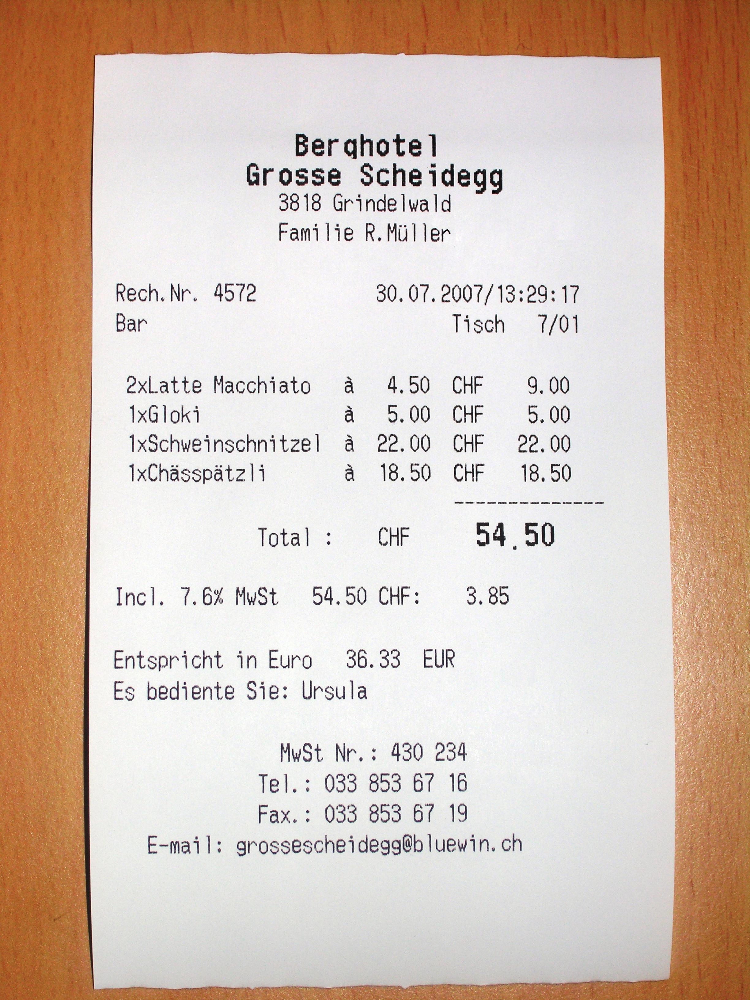

In [17]:
import PIL.Image

img = PIL.Image.open('image.jpg')   # 스위스 영수증
img

In [20]:
cfg = genai.GenerationConfig(
    candidate_count = 1,
    stop_sequences = None,
    max_output_tokens = None,
    temperature = 0.1,    # 1.,
    top_k = 32,   # 100: 전체 보겠다! 확률값에 맞게 샘플링하도록 함
    top_p = 0.5,  # 1.0: 전체 보겠다! 확률값에 맞게 샘플링하도록 함
)

model = genai.GenerativeModel('gemini-pro-vision')

response = model.generate_content(
    [
        "Transform the following recipt in a markdown table in English.",
        img
    ],
    generation_config=cfg, stream=True
)
response.resolve()
to_markdown(response.text)

>  # Berghotel Grosse Scheidegg
> Family R. Müller
> 3818 Grindelwald
> 
> Receipt No. 4572                      30.07.2007/13:29:17
> Bar                                         Table 7/01
> 
> |Amount|Dish|Price CHF|Total CHF|
> |:---|:---|:---|:---|
> |2|Latte Macciato|4.50|9.00|
> |1|Gloki|5.00|5.00|
> |1|Schweinschnitzel|22.00|22.00|
> |1|Chasspatzli|18.50|18.50|
> | |Total CHF | |54.50|
> | |Incl. 7.6% MwSt| |3.85|
> | |Total Euro| |36.33 EUR|
> 
> Served by: Ursula
> 
> MwSt. No.: 430 234
> Tel.: 033 853 67 16
> Fax: 033 853 67 19
> E-mail: grossescheidegg@bluewin.ch

## Embedding generation

https://ai.google.dev/examples/doc_search_emb?hl=en

In [21]:
import numpy as np
import pandas as pd

# 실제 존재하지 않는 가상의 Googlecar가 있다고 가정하자.
DOCUMENT1 = {
    "title": "Operating the Climate Control System",
    "content": "Your Googlecar has a climate control system that allows you to adjust the temperature and airflow in the car. To operate the climate control system, use the buttons and knobs located on the center console.  Temperature: The temperature knob controls the temperature inside the car. Turn the knob clockwise to increase the temperature or counterclockwise to decrease the temperature. Airflow: The airflow knob controls the amount of airflow inside the car. Turn the knob clockwise to increase the airflow or counterclockwise to decrease the airflow. Fan speed: The fan speed knob controls the speed of the fan. Turn the knob clockwise to increase the fan speed or counterclockwise to decrease the fan speed. Mode: The mode button allows you to select the desired mode. The available modes are: Auto: The car will automatically adjust the temperature and airflow to maintain a comfortable level. Cool: The car will blow cool air into the car. Heat: The car will blow warm air into the car. Defrost: The car will blow warm air onto the windshield to defrost it."}
DOCUMENT2 = {
    "title": "Touchscreen",
    "content": "Your Googlecar has a large touchscreen display that provides access to a variety of features, including navigation, entertainment, and climate control. To use the touchscreen display, simply touch the desired icon.  For example, you can touch the \"Navigation\" icon to get directions to your destination or touch the \"Music\" icon to play your favorite songs."}
DOCUMENT3 = {
    "title": "Shifting Gears",
    "content": "Your Googlecar has an automatic transmission. To shift gears, simply move the shift lever to the desired position.  Park: This position is used when you are parked. The wheels are locked and the car cannot move. Reverse: This position is used to back up. Neutral: This position is used when you are stopped at a light or in traffic. The car is not in gear and will not move unless you press the gas pedal. Drive: This position is used to drive forward. Low: This position is used for driving in snow or other slippery conditions."}

df = pd.DataFrame([DOCUMENT1, DOCUMENT2, DOCUMENT3])
df.columns = ['Title', 'Text']
df

,Title,Text
0,Operating the Climate Control System,Your Googlecar has a climate control system th...
1,Touchscreen,Your Googlecar has a large touchscreen display...
2,Shifting Gears,Your Googlecar has an automatic transmission. ...


The task types are:

Task Type | Description
---       | ---
RETRIEVAL_QUERY	| Specifies the given text is a query in a search/retrieval setting. 내적(dot product)한 값으로 얼마나 비슷한 값을 뽑는지 본다.
RETRIEVAL_DOCUMENT | Specifies the given text is a document in a search/retrieval setting. 내적(dot product)한 값으로 얼마나 비슷한 값을 뽑는지 본다.
SEMANTIC_SIMILARITY	| Specifies the given text will be used for Semantic Textual Similarity (STS).
CLASSIFICATION	| Specifies that the embeddings will be used for classification.
CLUSTERING	| Specifies that the embeddings will be used for clustering.

In [22]:
from google.api_core import retry

# Get the embeddings of each text and add to an embeddings column in the dataframe
@retry.Retry(timeout=300.0)   # 실패할 경우, 5분동안 쉰 후 재시도
def embed_fn(title, text):
  return genai.embed_content(model='models/embedding-001',
                             content=text,
                             task_type="retrieval_document",
                             title=title)["embedding"]

In [23]:
df['Embeddings'] = df.apply(lambda row: embed_fn(row['Title'], row['Text']), axis=1)
df

,Title,Text,Embeddings
0,Operating the Climate Control System,Your Googlecar has a climate control system th...,"[-0.033361107, -0.021217084, -0.049581926, -0...."
1,Touchscreen,Your Googlecar has a large touchscreen display...,"[0.009660736, -0.030662702, -0.017281422, -0.0..."
2,Shifting Gears,Your Googlecar has an automatic transmission. ...,"[-0.04270796, -0.007160868, -0.03242516, -0.02..."


In [25]:
len(df['Embeddings'].iloc[0])

768

In [26]:
query = "How do you shift gears in the Google car?"

request = genai.embed_content(model='models/embedding-001',
                              content=query,
                              task_type="retrieval_query")

In [27]:
len(request['embedding'])

768

In [28]:
dot_products = np.dot(np.stack(df['Embeddings']), request['embedding'])
idx = np.argmax(dot_products)
to_markdown('## ' + df.iloc[idx]['Title'] + '\n\n' + df.iloc[idx]['Text'])

> ## Shifting Gears
> 
> Your Googlecar has an automatic transmission. To shift gears, simply move the shift lever to the desired position.  Park: This position is used when you are parked. The wheels are locked and the car cannot move. Reverse: This position is used to back up. Neutral: This position is used when you are stopped at a light or in traffic. The car is not in gear and will not move unless you press the gas pedal. Drive: This position is used to drive forward. Low: This position is used for driving in snow or other slippery conditions.

In [29]:
dot_products

array([0.66797978, 0.66149501, 0.77680849])

### Question and Answering Application

In [30]:
def find_best_passage(query, dataframe):
  """
  Compute the distances between the query and each document in the dataframe
  using the dot product.
  """
  query_embedding = genai.embed_content(model='models/embedding-001',
                                        content=query,
                                        task_type="retrieval_query")
  dot_products = np.dot(np.stack(dataframe['Embeddings']), query_embedding["embedding"])
  idx = np.argmax(dot_products)
  return dataframe.iloc[idx]['Text'] # Return text from index with max value

def make_prompt(query, relevant_passage):
  escaped = relevant_passage.replace("'", "").replace('"', "").replace("\n", " ")
  # Prompting: 창의력 제한
  prompt = textwrap.dedent("""You are a helpful and informative bot that answers questions using text from the reference passage included below. \
  Be sure to respond in a complete sentence, being comprehensive, including all relevant background information. \
  However, you are talking to a non-technical audience, so be sure to break down complicated concepts and \
  strike a friendly and converstional tone. \
  If the passage is irrelevant to the answer, you may ignore it.
  QUESTION: '{query}'
  PASSAGE: '{relevant_passage}'

    ANSWER:
  """).format(query=query, relevant_passage=escaped)

  return prompt

In [31]:
cfg = genai.GenerationConfig(
    candidate_count = 1,
    stop_sequences = None,
    max_output_tokens = None,
    temperature = 0.,   # 0.: 가장 확률 높은값 1개만 출력
    top_k = 40,
    top_p = 1.,
)

In [32]:
query = "How do you shift gears in the Google car?"

passage = find_best_passage(query, df)
prompt = make_prompt(query, passage)

model = genai.GenerativeModel('gemini-pro')
answer = model.generate_content(prompt, generation_config=cfg)

to_markdown(answer.text)

> The Google car has an automatic transmission, so you don't need to worry about shifting gears manually. Simply move the shift lever to the desired position, such as Park, Reverse, Neutral, Drive, or Low, depending on what you need to do.

In [33]:
answer = model.generate_content(query, generation_config=cfg)

to_markdown(answer.text)

> The Google car does not have gears, as it is an electric vehicle. Electric vehicles do not require gears to change speed, as they use a single-speed transmission. Instead of shifting gears, the Google car uses an electric motor to control its speed.

- 우리는 이걸 RAG (Retriever Augmented Generation) 라고 부르기로 했어요.

  - FAISS(https://github.com/facebookresearch/faiss)
    - 페이스북이 속도 개선을 위해 사용하려고 만듦. 내부가 모두 C로 구성되어있음
  - LangChain(https://www.langchain.com/)
  - LlamaIndex(https://www.llamaindex.ai/)

## Multi-turn Conversation (Chat)

In [34]:
model = genai.GenerativeModel('gemini-pro')

chat = model.start_chat(history=[])

response = chat.send_message("In one sentence, explain how a computer works to a young child.")
to_markdown(response.text)

> A computer is like a very fast friend that can help you play games, do homework, and learn new things by following your instructions.

In [35]:
chat.history

[parts {
   text: "In one sentence, explain how a computer works to a young child."
 }
 role: "user",
 parts {
   text: "A computer is like a very fast friend that can help you play games, do homework, and learn new things by following your instructions."
 }
 role: "model"]

In [36]:
chat.history[-1]

parts {
  text: "A computer is like a very fast friend that can help you play games, do homework, and learn new things by following your instructions."
}
role: "model"

In [37]:
response = chat.send_message("Okay, how about a more detailed explanation to a high schooler?", stream=True)

for chunk in response:
  print(chunk.text)
  print("_"*80)

A computer works by following instructions, called a program, that are stored in its
________________________________________________________________________________
 memory. The program tells the computer what tasks to perform, such as calculations, data processing, and displaying information. The computer's central processing unit (CPU
________________________________________________________________________________
) reads and executes the program instructions, while the random access memory (RAM) temporarily stores the program and data being processed. Input devices, such as a keyboard and mouse, allow the user to interact with the computer and provide input. Output devices, such as a monitor and printer, display or print the results of the
________________________________________________________________________________
 program's instructions. The computer stores data and programs on storage devices, such as a hard disk drive or solid-state drive.

In summary, a computer follows a 

In [38]:
for message in chat.history:
  display(to_markdown(f'**{message.role}**: {message.parts[0].text}'))

> **user**: In one sentence, explain how a computer works to a young child.

> **model**: A computer is like a very fast friend that can help you play games, do homework, and learn new things by following your instructions.

> **user**: Okay, how about a more detailed explanation to a high schooler?

> **model**: A computer works by following instructions, called a program, that are stored in its memory. The program tells the computer what tasks to perform, such as calculations, data processing, and displaying information. The computer's central processing unit (CPU) reads and executes the program instructions, while the random access memory (RAM) temporarily stores the program and data being processed. Input devices, such as a keyboard and mouse, allow the user to interact with the computer and provide input. Output devices, such as a monitor and printer, display or print the results of the program's instructions. The computer stores data and programs on storage devices, such as a hard disk drive or solid-state drive.
> 
> In summary, a computer follows a program's instructions to process data, interact with the user, and store information.